# Восстановление карт ФЛ

Сравнение исходной и восстановленной карт фотолюминесценции для `CD_HM_dataset/1.csv`. Полиномиальные моменты в этом эксперименте восстановления не используются.

In [24]:
import matplotlib.pyplot as plt

from fl_reconstruction_utils import (
    BASIS_LABELS_EN,
    BASIS_LABELS_RU,
    RECONSTRUCTION_BASIS_TYPES,
    RESULTS_DIR,
    cosine_fidelity,
    get_reconstruction_orders,
    load_fl_map,
    plot_reconstruction_pair,
    reconstruct_map,
)

In [25]:
MAP_ID = 1
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

map_data = load_fl_map(MAP_ID)
map_data.shape

(27, 201)

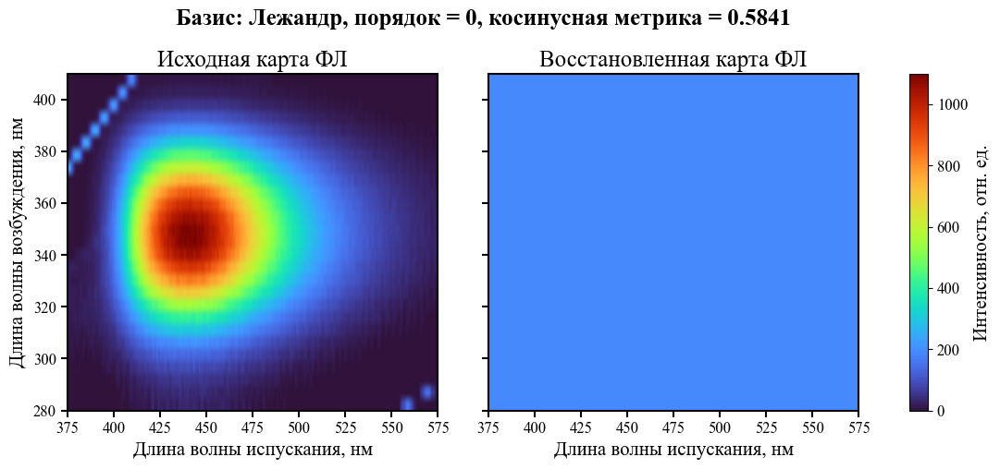

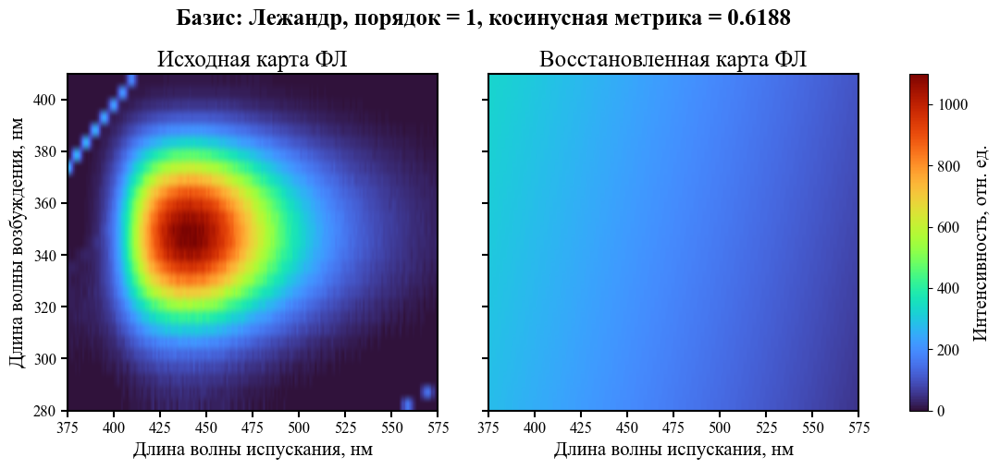

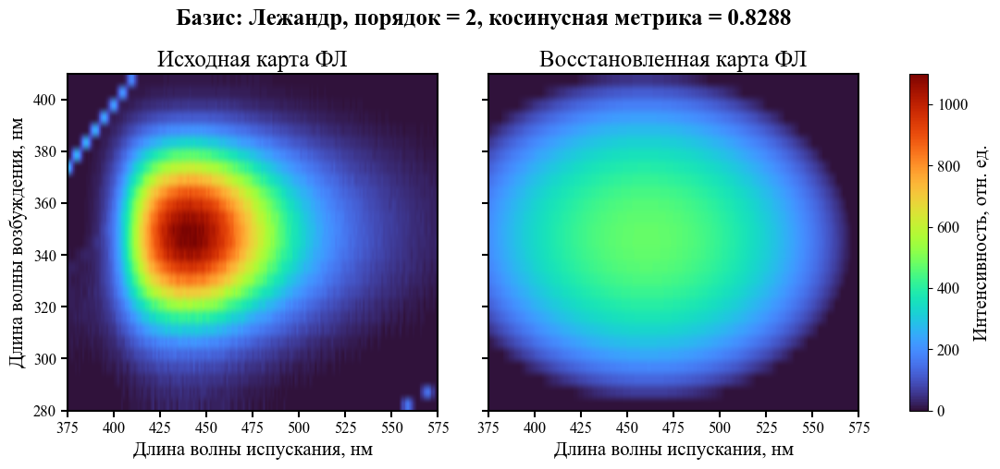

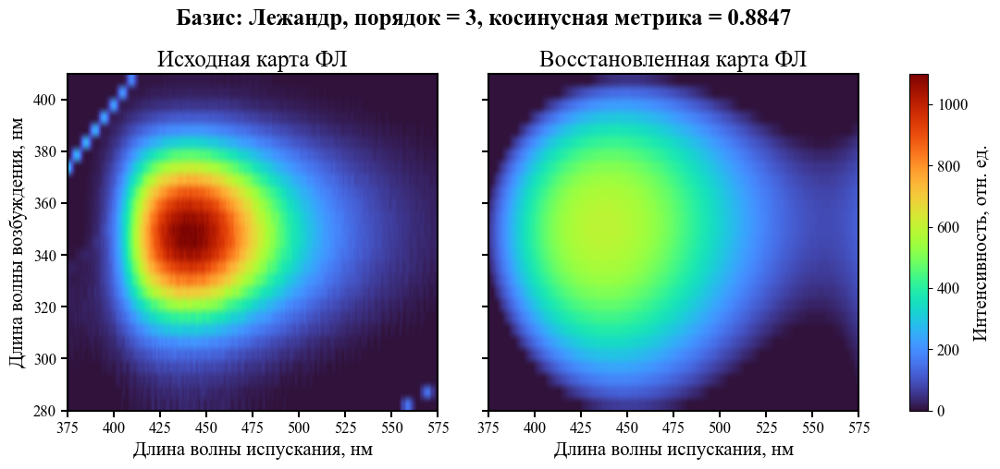

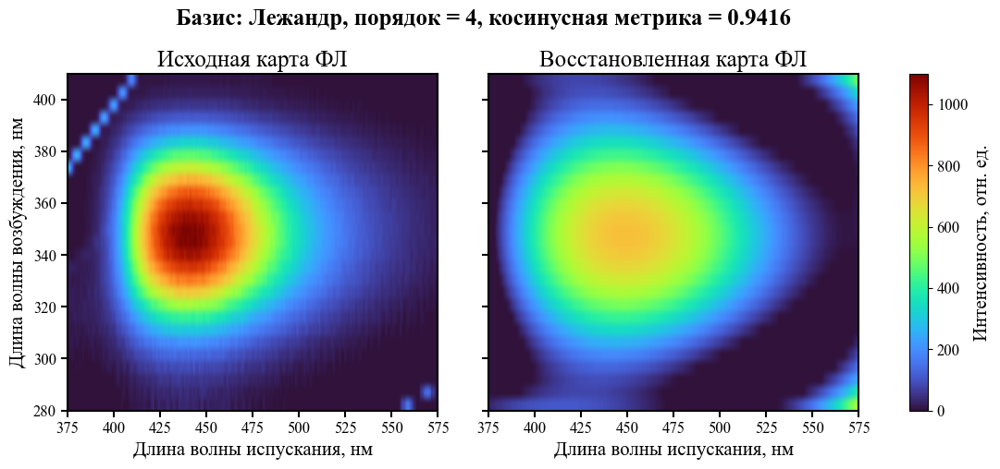

...

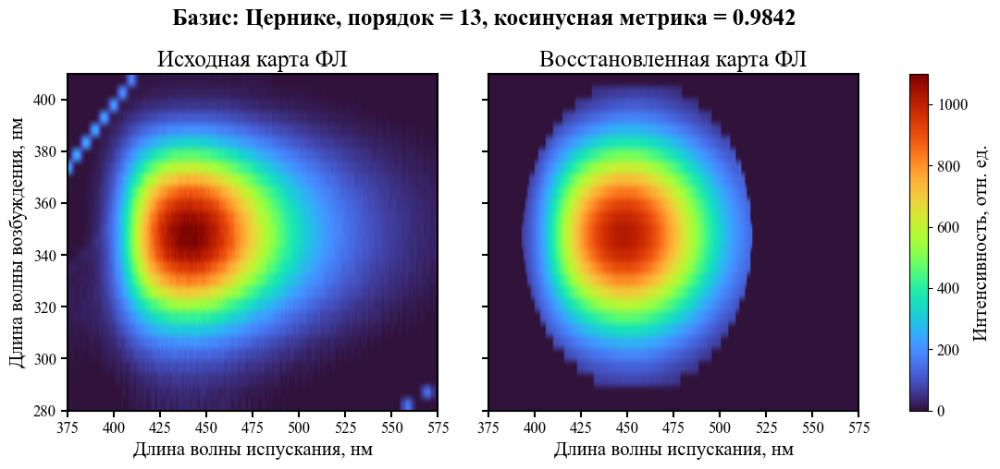

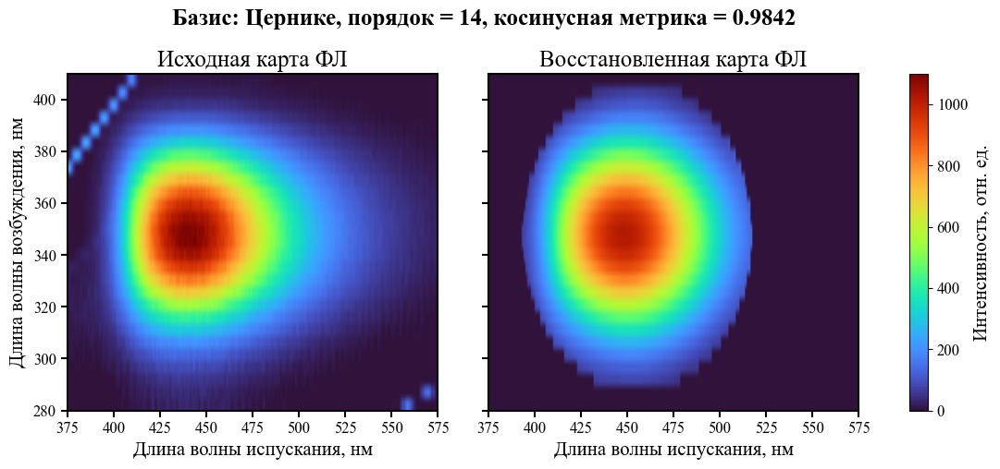

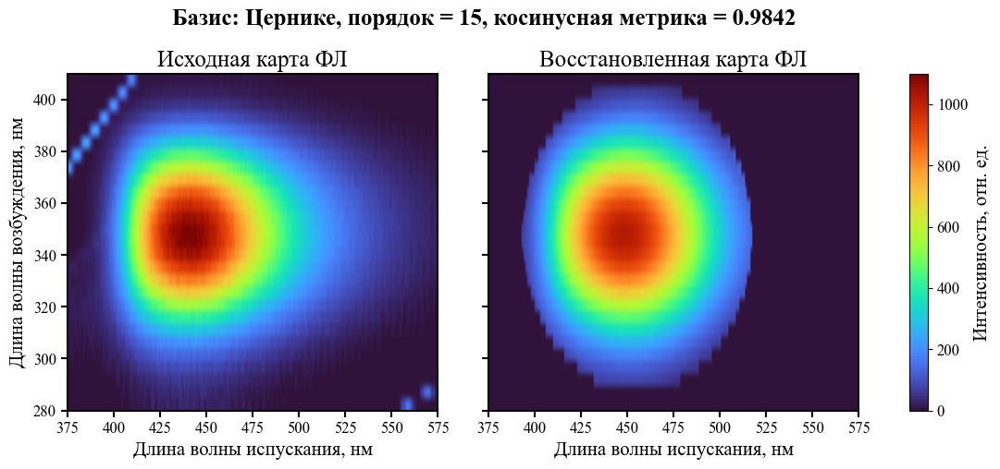

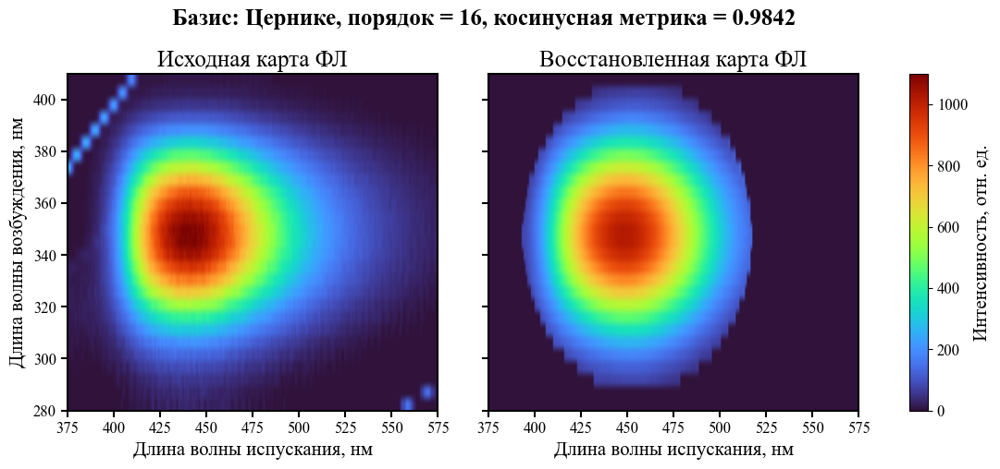

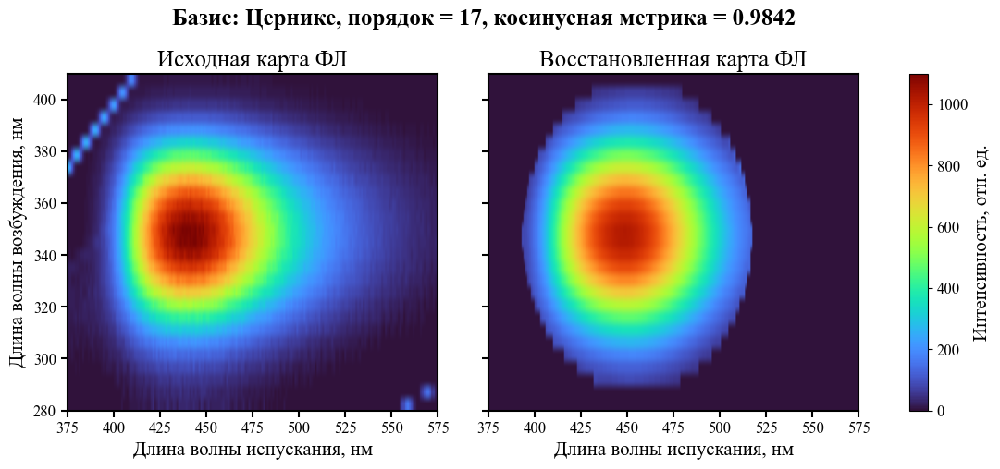

In [26]:
labels = {
    "original": "Исходная карта ФЛ",
    "reconstructed": "Восстановленная карта ФЛ",
    "emission": "Длина волны испускания, нм",
    "excitation": "Длина волны возбуждения, нм",
    "intensity": "Интенсивность, отн. ед.",
}

for basis_type in RECONSTRUCTION_BASIS_TYPES:
    for order in get_reconstruction_orders(basis_type):
        reconstructed = reconstruct_map(map_data, basis_type, order)
        fidelity = cosine_fidelity(map_data, reconstructed)
        title = (
            f"Базис: {BASIS_LABELS_RU[basis_type]}, "
            f"порядок = {order}, косинусная метрика = {fidelity:.4f}"
        )
        fig = plot_reconstruction_pair(
            map_data,
            reconstructed,
            title=title,
            labels=labels,
        )
        figure_path = RESULTS_DIR / f"reconstruction_ru_{basis_type}_order_{order}.png"
        fig.savefig(figure_path, dpi=300, bbox_inches="tight")
        plt.show()

-----

In [27]:
from __future__ import annotations
from fl_reconstruction_utils import set_matplotlib_style, EMISSION_WAVELENGTHS, EXCITATION_WAVELENGTHS

import json
from pathlib import Path
from typing import Iterable

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

def _plot_reconstruction_pair(
    original: np.ndarray,
    reconstructed: np.ndarray,
    title: str,
    labels: dict[str, str],
    figsize: tuple[float, float] = (12, 5),
) -> plt.Figure:
    """Plot original and reconstructed FL maps side by side.

    Args:
        original: Original FL map.
        reconstructed: Reconstructed FL map.
        title: Figure title.
        labels: Text labels for title, axes, and panel names.
        figsize: Figure size in inches.

    Returns:
        Matplotlib figure.
    """

    set_matplotlib_style()
    vmin = float(0)
    vmax = float(1100.374)
    extent = [
        float(EMISSION_WAVELENGTHS.min()),
        float(EMISSION_WAVELENGTHS.max()),
        float(EXCITATION_WAVELENGTHS.min()),
        float(EXCITATION_WAVELENGTHS.max()),
    ]

    fig = plt.figure(figsize=figsize)
    grid_spec = fig.add_gridspec(
        nrows=1,
        ncols=3,
        width_ratios=(1, 1, 0.05),
        wspace=0.20,
    )
    left_axis = fig.add_subplot(grid_spec[0, 0])
    right_axis = fig.add_subplot(
        grid_spec[0, 1],
        sharex=left_axis,
        sharey=left_axis,
    )
    colorbar_axis = fig.add_subplot(grid_spec[0, 2])
    axes = np.array([left_axis, right_axis])
    fig.suptitle(title, fontsize=18, fontweight="bold")

    for axis_index, (axis, data, panel_title) in enumerate(
        zip(
            axes,
            (original, reconstructed),
            (labels["original"], labels["reconstructed"]),
        )
    ):
        image = axis.imshow(
            data,
            extent=extent,
            origin="lower",
            aspect="auto",
            cmap="turbo",
            vmin=vmin,
            vmax=vmax,
        )
        axis.set_title(panel_title)
        axis.set_xlabel(labels["emission"])
        if axis_index == 0:
            axis.set_ylabel(labels["excitation"])
        else:
            axis.set_ylabel("")
            axis.tick_params(axis="y", labelleft=False)
        axis.tick_params(direction="out", length=5, width=1.5)
        for spine in axis.spines.values():
            spine.set_linewidth(1.5)

    colorbar = fig.colorbar(image, cax=colorbar_axis)
    colorbar.set_label(labels["intensity"])
    fig.subplots_adjust(top=0.84)
    return fig

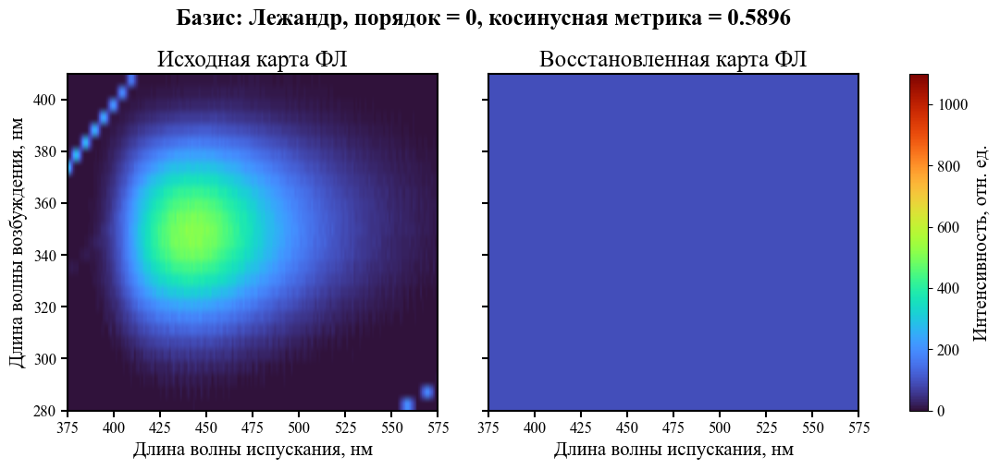

In [28]:
MAP_ID = 4
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

map_data = load_fl_map(MAP_ID)
map_data.shape

labels = {
    "original": "Исходная карта ФЛ",
    "reconstructed": "Восстановленная карта ФЛ",
    "emission": "Длина волны испускания, нм",
    "excitation": "Длина волны возбуждения, нм",
    "intensity": "Интенсивность, отн. ед.",
}
basis_type = RECONSTRUCTION_BASIS_TYPES[0]
order = get_reconstruction_orders(basis_type)[0]

reconstructed = reconstruct_map(map_data, basis_type, order)
fidelity = cosine_fidelity(map_data, reconstructed)
title = (
    f"Базис: {BASIS_LABELS_RU[basis_type]}, "
    f"порядок = {order}, косинусная метрика = {fidelity:.4f}"
)
fig = _plot_reconstruction_pair(
    map_data,
    reconstructed,
    title=title,
    labels=labels,
)

In [29]:
map_data.max()

np.float64(523.105)